In [1]:
import pandas as pd 
file_path = "labels_df.csv"

# Load the CSV into a DataFrame
labels_df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(labels_df.head())

                                          frame_path       label split
0  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
1  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
2  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
3  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
4  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test


In [2]:
# Separate data into train and test based on the 'split' column
train_df = labels_df[labels_df['split'] == 'train'].reset_index(drop=True)
test_df = labels_df[labels_df['split'] == 'test'].reset_index(drop=True)

# Since there may not be a validation set, split a portion of the training data for validation
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

print(f"Total samples: {len(labels_df)}")
print(f"Training samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")


Total samples: 108135
Training samples: 65887
Validation samples: 16472
Test samples: 25776


In [9]:
small_train_df = train_df.sample(n=1000, random_state=42)
small_train_dataset = HMDBDataset(small_train_df, transform=train_transforms, label_to_idx=label_to_idx)
small_train_loader = DataLoader(small_train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)


In [6]:
from torch.utils.data import Dataset
from PIL import Image

class HMDBDataset(Dataset):
    def __init__(self, df, transform=None, label_to_idx=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

        # Create label to index mapping if not provided
        if label_to_idx is None:
            labels = sorted(self.df['label'].unique())
            self.label_to_idx = {label: idx for idx, label in enumerate(labels)}
        else:
            self.label_to_idx = label_to_idx

    def __len__(self):
        
        return len(self.df)
        

    def __getitem__(self, idx):

        
        try:
            frame_path = self.df.iloc[idx]['frame_path']
            label = self.df.iloc[idx]['label']
            image = Image.open(frame_path).convert('RGB')
           
            if self.transform:
                image = self.transform(image)

            label_idx = self.label_to_idx[label]
            return image, label_idx
        except Exception as e:
            print(f"Error loading image {self.df.iloc[idx]['frame_path']}: {e}")
            return self.__getitem__((idx + 1) % len(self))



In [13]:
from torchvision import transforms
from torch.utils.data import DataLoader

# Define transforms
train_transforms = transforms.Compose([
    transforms.Resize((224, 224))
,
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])


val_transforms = transforms.Compose([
    transforms.Resize((224, 224))
,
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])

# Create label_to_idx mapping based on training data
labels = sorted(small_train_df['label'].unique())
label_to_idx = {label: idx for idx, label in enumerate(labels)}

# Create datasets
train_dataset = HMDBDataset(small_train_df, transform=train_transforms, label_to_idx=label_to_idx)
val_dataset = HMDBDataset(val_df, transform=val_transforms, label_to_idx=label_to_idx)
test_dataset = HMDBDataset(test_df, transform=val_transforms, label_to_idx=label_to_idx)

# Create data loaders
# Create data loaders
batch_size = 32
train_loader = DataLoader(small_train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)


# Number of classes
num_classes = len(label_to_idx)
print(f"Number of classes: {num_classes}")


Number of classes: 51


In [14]:
from transformers import ViTForImageClassification, ViTFeatureExtractor, ViTConfig

# Load the feature extractor
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')

# Create a new configuration with the desired number of labels
config = ViTConfig.from_pretrained('google/vit-base-patch16-224-in21k', num_labels=num_classes)

# Initialize a new model with the modified configuration
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k', config=config)


c:\Users\Codew\anaconda3\envs\nlp\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\Codew\anaconda3\envs\nlp\Lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import os
import cv2
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms
from transformers import ViTForImageClassification, ViTFeatureExtractor, ViTConfig
from tqdm import tqdm

# 1. Frame Extraction Function
def extract_frames(video_path, output_dir, frame_rate=5):
    """
    Extract frames from a video at a specified frame rate.

    Args:
        video_path (str): Path to the video file.
        output_dir (str): Directory to save extracted frames.
        frame_rate (int): Number of frames to extract per second.
    """
    os.makedirs(output_dir, exist_ok=True)
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()

    if not success:
        print(f"Failed to read video: {video_path}")
        return

    fps = vidcap.get(cv2.CAP_PROP_FPS)
    if fps == 0 or fps is None:
        fps = 30  # Assume a default FPS if unable to get from video

    interval = max(int(fps / frame_rate), 1)
    count = 0
    frame_id = 0

    while success:
        if count % interval == 0:
            frame_path = os.path.join(output_dir, f"frame_{frame_id:05d}.jpg")
            cv2.imwrite(frame_path, image)
            frame_id += 1
        success, image = vidcap.read()
        count += 1

    vidcap.release()

# 2. Dataset Processing
def process_dataset(video_dir, frames_dir, csv_output='labels_df.csv'):
    data = []

    # Iterate over each action class (folder names are class labels)
    for class_label in os.listdir(video_dir):
        class_dir = os.path.join(video_dir, class_label)
        if not os.path.isdir(class_dir):
            continue  # Skip if not a directory

        # Iterate over video files in the class directory
        for video_file in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_file)
            if not video_file.lower().endswith(('.avi', '.mp4', '.mov')):
                continue  # Skip non-video files

            # Determine the split (train or test) based on the filename
            if 'training' in video_file.lower():
                split = 'train'
            elif 'testing' in video_file.lower():
                split = 'test'
            else:
                split = 'unknown'

            # Define the output directory for frames
            output_dir = os.path.join(frames_dir, class_label, split, os.path.splitext(video_file)[0])
            extract_frames(video_path, output_dir)

            # Collect frame paths and labels for the DataFrame
            for frame_name in os.listdir(output_dir):
                frame_path = os.path.join(output_dir, frame_name)
                data.append({'frame_path': frame_path, 'label': class_label, 'split': split})

    # Create a DataFrame from the collected data
    labels_df = pd.DataFrame(data)

    # Display the first few rows
    print(labels_df.head())

    # Save to CSV for future reference
    labels_df.to_csv(csv_output, index=False)

    return labels_df

# 3. Define the HMDBDataset Class
class HMDBDataset(Dataset):
    def __init__(self, df, transform=None, label_to_idx=None):
        """
        Args:
            df (DataFrame): DataFrame containing 'frame_path', 'label', and 'split' columns.
            transform (callable, optional): Optional transform to be applied on a sample.
            label_to_idx (dict, optional): Dictionary mapping labels to indices.
        """
        self.df = df.reset_index(drop=True)
        self.transform = transform

        # Create label to index mapping if not provided
        if label_to_idx is None:
            labels = sorted(self.df['label'].unique())
            self.label_to_idx = {label: idx for idx, label in enumerate(labels)}
        else:
            self.label_to_idx = label_to_idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        try:
            frame_path = self.df.iloc[idx]['frame_path']
            label = self.df.iloc[idx]['label']
            image = Image.open(frame_path).convert('RGB')

            if self.transform:
                image = self.transform(image)

            label_idx = self.label_to_idx[label]
            return image, label_idx
        except Exception as e:
            print(f"Error loading image {self.df.iloc[idx]['frame_path']}: {e}")
            # Optionally, you can skip this sample or handle it differently
            return self.__getitem__((idx + 1) % len(self))

# 4. Main Execution
if __name__ == '__main__':
    # Paths
    video_dir = r'C:\Users\Codew\Downloads\archive (1)\HMDB_dataset'
    frames_dir = r'C:\Users\Codew\Downloads\archive (1)\HMDB_frames'
    csv_output = 'labels_df.csv'

    # Process the dataset (Extract frames and create labels_df.csv)
    labels_df = process_dataset(video_dir, frames_dir, csv_output)

    # Load the CSV into a DataFrame
    labels_df = pd.read_csv(csv_output)

    # Display the first few rows of the DataFrame
    print(labels_df.head())

    # Separate data into train and test based on the 'split' column
    train_df = labels_df[labels_df['split'] == 'train'].reset_index(drop=True)
    test_df = labels_df[labels_df['split'] == 'test'].reset_index(drop=True)

    # Since there may not be a validation set, split a portion of the training data for validation
    train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

    print(f"Total samples: {len(labels_df)}")
    print(f"Training samples: {len(train_df)}")
    print(f"Validation samples: {len(val_df)}")
    print(f"Test samples: {len(test_df)}")

    # Optionally, create a smaller subset for quick testing
    small_train_df = train_df.sample(n=1000, random_state=42)

    # Define transforms with corrected Resize
    train_transforms = transforms.Compose([
        transforms.Resize((224, 224)),  # Ensure all images are 224x224
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225]),
    ])

    val_transforms = transforms.Compose([
        transforms.Resize((224, 224)),  # Ensure all images are 224x224
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225]),
    ])

    # Create label_to_idx mapping based on training data
    labels = sorted(small_train_df['label'].unique())
    label_to_idx = {label: idx for idx, label in enumerate(labels)}

    # Create datasets
    small_train_dataset = HMDBDataset(small_train_df, transform=train_transforms, label_to_idx=label_to_idx)
    val_dataset = HMDBDataset(val_df, transform=val_transforms, label_to_idx=label_to_idx)
    test_dataset = HMDBDataset(test_df, transform=val_transforms, label_to_idx=label_to_idx)

    # Create data loaders
    batch_size = 32
    train_loader = DataLoader(small_train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    # Number of classes
    num_classes = len(label_to_idx)
    print(f"Number of classes: {num_classes}")

    # Initialize the model
    feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')

    config = ViTConfig.from_pretrained('google/vit-base-patch16-224-in21k', num_labels=num_classes)
    model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k', config=config)

    # Move model to device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Define optimizer and loss function
    learning_rate = 1e-4
    num_epochs = 20  # Increased to 20 as per your request

    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()

    # Early Stopping Class
    class EarlyStopping:
        def __init__(self, patience=3, delta=0):
            self.patience = patience
            self.delta = delta
            self.best_loss = None
            self.counter = 0
            self.early_stop = False

        def __call__(self, val_loss):
            if self.best_loss is None:
                self.best_loss = val_loss
            elif val_loss > self.best_loss - self.delta:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True
            else:
                self.best_loss = val_loss
                self.counter = 0

    early_stopping = EarlyStopping(patience=3, delta=0.01)

    # Checkpoint Saving Function
    def save_checkpoint(model, epoch, val_loss):
        checkpoint_dir = './checkpoints'
        os.makedirs(checkpoint_dir, exist_ok=True)
        checkpoint_path = os.path.join(checkpoint_dir, f'vit_epoch_{epoch}_val_loss_{val_loss:.4f}.pt')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'val_loss': val_loss,
        }, checkpoint_path)

    # Training Loop
    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        correct_predictions = 0
        total_predictions = 0

        for images, labels in tqdm(train_loader, desc=f'Epoch {epoch}/{num_epochs}'):
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_predictions += torch.sum(preds == labels)
            total_predictions += labels.size(0)

        epoch_loss = running_loss / len(small_train_dataset)
        epoch_acc = correct_predictions.double() / total_predictions
        print(f'Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}')

        # Validation
        model.eval()
        val_running_loss = 0.0
        val_correct_predictions = 0
        val_total_predictions = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images).logits
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct_predictions += torch.sum(preds == labels)
                val_total_predictions += labels.size(0)

        val_loss = val_running_loss / len(val_dataset)
        val_acc = val_correct_predictions.double() / val_total_predictions
        print(f'Validation Loss: {val_loss:.4f}, Accuracy: {val_acc:.4f}')

        # Checkpointing
        save_checkpoint(model, epoch, val_loss)

        # Early Stopping
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping triggered.")
            break

    # Test Set Evaluation
    model.eval()
    test_correct_predictions = 0
    test_total_predictions = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images).logits
            _, preds = torch.max(outputs, 1)
            test_correct_predictions += torch.sum(preds == labels)
            test_total_predictions += labels.size(0)

    test_acc = test_correct_predictions.double() / test_total_predictions
    print(f'Test Accuracy: {test_acc:.4f}')


                                          frame_path       label split
0  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
1  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
2  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
3  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
4  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
                                          frame_path       label split
0  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
1  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
2  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
3  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
4  C:\Users\Codew\Downloads\archive (1)\HMDB_fram...  brush_hair  test
Total samples: 519383
Training samples: 310301
Validation samples: 77576
Test samples: 131506
Number of classes: 51


c:\Users\Codew\anaconda3\envs\nlp\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\Codew\anaconda3\envs\nlp\Lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Epoch 1/20: 100%|██████████| 32/32 [00:35<00:00,  1.12s/it]


Training Loss: 3.7443, Accuracy: 0.1530
Validation Loss: 3.5492, Accuracy: 0.2470


Epoch 2/20: 100%|██████████| 32/32 [00:25<00:00,  1.28it/s]


Training Loss: 3.2459, Accuracy: 0.4200


In [ ]:
import os
import cv2
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms
from transformers import ViTForImageClassification, ViTFeatureExtractor, ViTConfig
from tqdm import tqdm

# 1. Frame Extraction Function
def extract_frames(video_path, output_dir, frame_rate=5):
    """
    Extract frames from a video at a specified frame rate.

    Args:
        video_path (str): Path to the video file.
        output_dir (str): Directory to save extracted frames.
        frame_rate (int): Number of frames to extract per second.
    """
    os.makedirs(output_dir, exist_ok=True)
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()

    if not success:
        print(f"Failed to read video: {video_path}")
        return

    fps = vidcap.get(cv2.CAP_PROP_FPS)
    if fps == 0 or fps is None:
        fps = 30  # Assume a default FPS if unable to get from video

    interval = max(int(fps / frame_rate), 1)
    count = 0
    frame_id = 0

    while success:
        if count % interval == 0:
            frame_path = os.path.join(output_dir, f"frame_{frame_id:05d}.jpg")
            cv2.imwrite(frame_path, image)
            frame_id += 1
        success, image = vidcap.read()
        count += 1

    vidcap.release()

# 2. Dataset Processing
def process_dataset(video_dir, frames_dir, csv_output='labels_df.csv'):
    data = []

    # Iterate over each action class (folder names are class labels)
    for class_label in os.listdir(video_dir):
        class_dir = os.path.join(video_dir, class_label)
        if not os.path.isdir(class_dir):
            continue  # Skip if not a directory

        # Iterate over video files in the class directory
        for video_file in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_file)
            if not video_file.lower().endswith(('.avi', '.mp4', '.mov')):
                continue  # Skip non-video files

            # Determine the split (train or test) based on the filename
            if 'training' in video_file.lower():
                split = 'train'
            elif 'testing' in video_file.lower():
                split = 'test'
            else:
                split = 'unknown'

            # Define the output directory for frames
            output_dir = os.path.join(frames_dir, class_label, split, os.path.splitext(video_file)[0])
            extract_frames(video_path, output_dir,15)

            # Collect frame paths and labels for the DataFrame
            for frame_name in os.listdir(output_dir):
                frame_path = os.path.join(output_dir, frame_name)
                data.append({'frame_path': frame_path, 'label': class_label, 'split': split})

    # Create a DataFrame from the collected data
    labels_df = pd.DataFrame(data)

    # Display the first few rows
    print(labels_df.head())

    # Save to CSV for future reference
    labels_df.to_csv(csv_output, index=False)

    return labels_df

# 3. Define the HMDBDataset Class
class HMDBDataset(Dataset):
    def __init__(self, df, transform=None, label_to_idx=None):
        """
        Args:
            df (DataFrame): DataFrame containing 'frame_path', 'label', and 'split' columns.
            transform (callable, optional): Optional transform to be applied on a sample.
            label_to_idx (dict, optional): Dictionary mapping labels to indices.
        """
        self.df = df.reset_index(drop=True)
        self.transform = transform

        # Create label to index mapping if not provided
        if label_to_idx is None:
            labels = sorted(self.df['label'].unique())
            self.label_to_idx = {label: idx for idx, label in enumerate(labels)}
        else:
            self.label_to_idx = label_to_idx

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        try:
            frame_path = self.df.iloc[idx]['frame_path']
            label = self.df.iloc[idx]['label']
            image = Image.open(frame_path).convert('RGB')

            if self.transform:
                image = self.transform(image)

            label_idx = self.label_to_idx[label]
            return image, label_idx
        except Exception as e:
            print(f"Error loading image {self.df.iloc[idx]['frame_path']}: {e}")
            # Optionally, you can skip this sample or handle it differently
            return self.__getitem__((idx + 1) % len(self))

# 4. Main Execution
if __name__ == '__main__':
    # Paths
    video_dir = r'C:\Users\Codew\Downloads\archive (1)\HMDB_dataset'
    frames_dir = r'C:\Users\Codew\Downloads\archive (1)\HMDB_frames'
    csv_output = 'labels_df.csv'

    # Process the dataset (Extract frames and create labels_df.csv)
    labels_df = process_dataset(video_dir, frames_dir, csv_output)

    # Load the CSV into a DataFrame
    labels_df = pd.read_csv(csv_output)

    # Display the first few rows of the DataFrame
    print(labels_df.head())

    # Separate data into train and test based on the 'split' column
    train_df = labels_df[labels_df['split'] == 'train'].reset_index(drop=True)
    test_df = labels_df[labels_df['split'] == 'test'].reset_index(drop=True)

    # Since there may not be a validation set, split a portion of the training data for validation
    train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

    print(f"Total samples: {len(labels_df)}")
    print(f"Training samples: {len(train_df)}")
    print(f"Validation samples: {len(val_df)}")
    print(f"Test samples: {len(test_df)}")

    # Optionally, create a smaller subset for quick testing
    small_train_df = train_df.sample(n=1000, random_state=42)

    # Define transforms with corrected Resize
    train_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomResizedCrop(size=(224, 224), antialias=True),
        transforms.ToTensor(),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225]),
    ])

    val_transforms = transforms.Compose([
        transforms.Resize((224, 224)),  # Ensure all images are 224x224
        transforms.ToTensor(),
        transforms.RandomResizedCrop(size=(224, 224), antialias=True),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225]),
    ])

    # Create label_to_idx mapping based on training data
    labels = sorted(small_train_df['label'].unique())
    label_to_idx = {label: idx for idx, label in enumerate(labels)}

    # Create datasets
    small_train_dataset = HMDBDataset(small_train_df, transform=train_transforms, label_to_idx=label_to_idx)
    val_dataset = HMDBDataset(val_df, transform=val_transforms, label_to_idx=label_to_idx)
    test_dataset = HMDBDataset(test_df, transform=val_transforms, label_to_idx=label_to_idx)

    # Create data loaders
    batch_size = 32
    train_loader = DataLoader(small_train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    # Number of classes
    num_classes = len(label_to_idx)
    print(f"Number of classes: {num_classes}")

    # Initialize the model
    feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')

    config = ViTConfig.from_pretrained('google/vit-base-patch16-224-in21k', num_labels=num_classes)
    model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k', config=config)

    # Move model to device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Define optimizer and loss function
    learning_rate = 1e-4
    num_epochs = 20  # Increased to 20 as per your request

    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()

    # Early Stopping Class
    class EarlyStopping:
        def __init__(self, patience=3, delta=0):
            self.patience = patience
            self.delta = delta
            self.best_loss = None
            self.counter = 0
            self.early_stop = False

        def __call__(self, val_loss):
            if self.best_loss is None:
                self.best_loss = val_loss
            elif val_loss > self.best_loss - self.delta:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True
            else:
                self.best_loss = val_loss
                self.counter = 0

    early_stopping = EarlyStopping(patience=3, delta=0.01)

    # Checkpoint Saving Function
    def save_checkpoint(model, epoch, val_loss):
        checkpoint_dir = './checkpoints'
        os.makedirs(checkpoint_dir, exist_ok=True)
        checkpoint_path = os.path.join(checkpoint_dir, f'vit_epoch_{epoch}_val_loss_{val_loss:.4f}.pt')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'val_loss': val_loss,
        }, checkpoint_path)

    # Training Loop
    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        correct_predictions = 0
        total_predictions = 0

        for images, labels in tqdm(train_loader, desc=f'Epoch {epoch}/{num_epochs}'):
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_predictions += torch.sum(preds == labels)
            total_predictions += labels.size(0)

        epoch_loss = running_loss / len(small_train_dataset)
        epoch_acc = correct_predictions.double() / total_predictions
        print(f'Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}')

        # Validation
        model.eval()
        val_running_loss = 0.0
        val_correct_predictions = 0
        val_total_predictions = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images).logits
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct_predictions += torch.sum(preds == labels)
                val_total_predictions += labels.size(0)

        val_loss = val_running_loss / len(val_dataset)
        val_acc = val_correct_predictions.double() / val_total_predictions
        print(f'Validation Loss: {val_loss:.4f}, Accuracy: {val_acc:.4f}')

        # Checkpointing
        save_checkpoint(model, epoch, val_loss)

        # Early Stopping
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping triggered.")
            break

    # Test Set Evaluation
    model.eval()
    test_correct_predictions = 0
    test_total_predictions = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images).logits
            _, preds = torch.max(outputs, 1)
            test_correct_predictions += torch.sum(preds == labels)
            test_total_predictions += labels.size(0)

    test_acc = test_correct_predictions.double() / test_total_predictions
    print(f'Test Accuracy: {test_acc:.4f}')


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([51]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([51, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/2366344514.py:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1/8:   0%|          | 0/870 [00:00<?, ?it/s]/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


Validation Loss: 0.6724 | Acc: 79.63%


Validation Epoch 2/: 100%|██████████| 259/259 [02:48<00:00,  1.54it/s]


Validation Loss: 0.5278 | Acc: 84.85%


Validation Epoch 3/: 100%|██████████| 259/259 [02:50<00:00,  1.52it/s]


Validation Loss: 0.4562 | Acc: 86.33%


Validation Epoch 4/: 100%|██████████| 259/259 [02:50<00:00,  1.52it/s]


Validation Loss: 0.4230 | Acc: 88.46%


Validation Epoch 5/: 100%|██████████| 259/259 [02:48<00:00,  1.53it/s]


Validation Loss: 0.4176 | Acc: 88.91%


Validation Epoch 6/: 100%|██████████| 259/259 [02:48<00:00,  1.54it/s]


Validation Loss: 0.5656 | Acc: 85.56%
epochs_without_improvement. 1


Validation Epoch 7/: 100%|██████████| 259/259 [02:51<00:00,  1.51it/s]


Validation Loss: 0.5745 | Acc: 86.01%
epochs_without_improvement. 2


Validation Epoch 8/: 100%|██████████| 259/259 [02:51<00:00,  1.51it/s]

Validation Loss: 0.5348 | Acc: 86.27%
epochs_without_improvement. 3
Early stopping triggered.


In [ ]:
# Validation Loop
# model.eval()
criterion = torch.nn.CrossEntropyLoss()
val_loss = 0
val_correct = 0
val_total = 0
with torch.no_grad():
    for frames, labels in tqdm(val_loader, desc=f'Validation Epoch {0+1}/'):
        frames, labels = frames.to(device), labels.to(device)
        with torch.amp.autocast(device_type='cuda'):
            outputs = model(frames)
            loss = criterion(outputs, labels)
        val_loss += loss.item()
        _, predicted = outputs.max(1)
        val_total += labels.size(0)
        val_correct += predicted.eq(labels).sum().item()

        del frames, labels, outputs, loss  # Clear memory
        torch.cuda.empty_cache()

val_acc = 100. * val_correct / val_total
print(f'Validation Loss: {val_loss/len(val_loader):.4f} | Acc: {val_acc:.2f}%')


Validation Epoch 1/: 100%|██████████| 259/259 [02:53<00:00,  1.49it/s]

Validation Loss: 0.5291 | Acc: 86.98%


video_paths_test: /kaggle/input/hmdb-human-activity-recognition/HMDB_dataset/golf/testing_10.avi
original label  7
frames shape torch.Size([1, 73, 3, 224, 224])
Predicted label for the video: 14


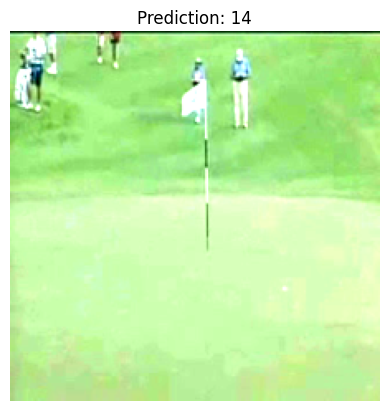

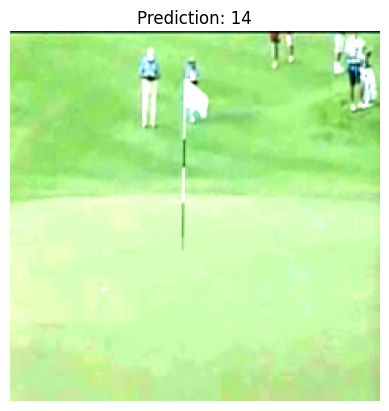

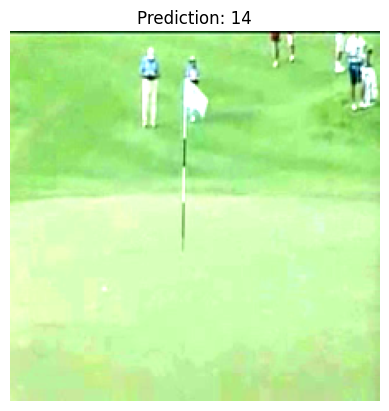

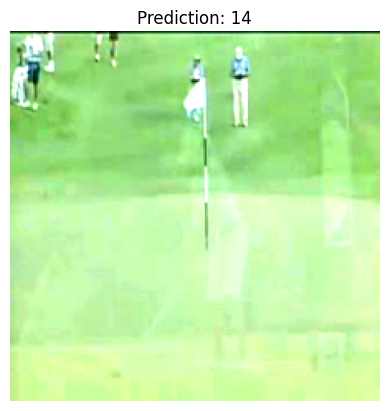

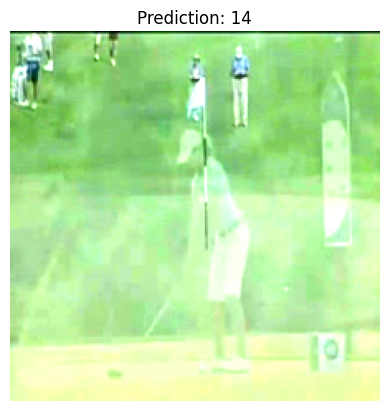

...

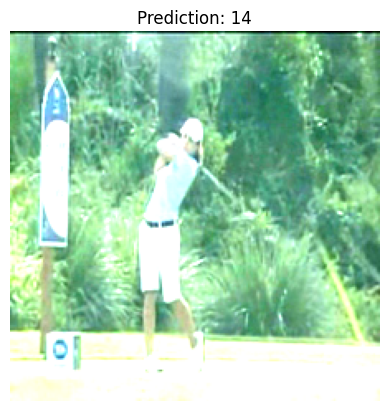

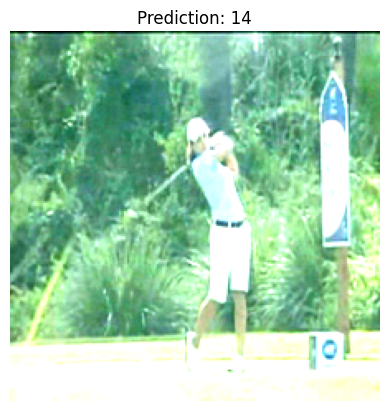

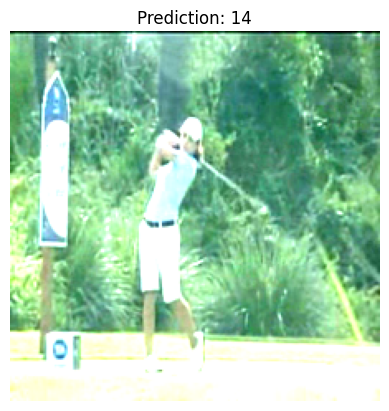

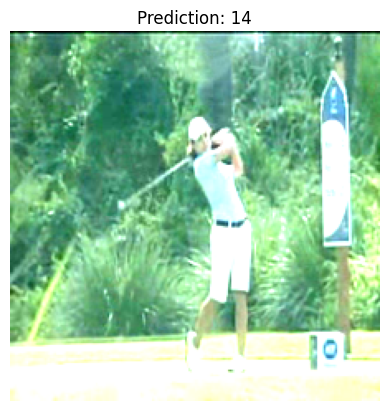

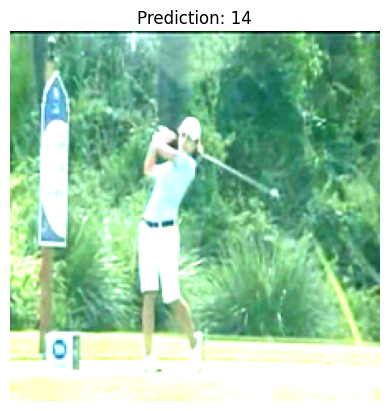

In [ ]:
# Load and test a single video after training
def test_single_video(video_path, model):
    # Load frames from the video using OpenCV
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert color for consistency
        frames.append(frame)
    cap.release()

    # Transform frames
    transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),

])
    frames = [transform(frame) for frame in frames]
    frames = torch.stack(frames).unsqueeze(0).to(device)  # Add batch dimension

    print("frames shape",frames.shape)

    # Make prediction
    model.eval()
    with torch.no_grad():
        outputs = model(frames)
        _, predicted_class = torch.max(outputs, 1)
        predicted_label = predicted_class.item()

    # Display video with prediction
    print(f"Predicted label for the video: {predicted_label}")

    # Play video with prediction label
    for frame in frames[0]:  # frames[0] removes batch dimension
        frame_np = frame.cpu().numpy().transpose(1, 2, 0)  # Convert to NumPy and HWC format
        plt.imshow((frame_np * 0.5 + 0.5).clip(0, 1))  # Unnormalize for display
        plt.title(f"Prediction: {predicted_label}")
        plt.axis('off')
        plt.pause(0.1)  # Adjust playback speed as needed
    plt.close()

# Run the test
# video_path = '/kaggle/input/hmdb-human-activity-recognition/HMDB_dataset/dive/testing_10.avi'  # Replace with the actual path of the test video
video_path = video_paths_test[420]
print("video_paths_test:",video_paths_test[420])
print("original label ",labels_test[200])

test_single_video(video_path, model)

Validation Epoch 1/: 100%|██████████| 259/259 [02:53<00:00,  1.49it/s]

Validation Loss: 0.5291 | Acc: 86.98%
